# Clustering and PCA

In [1]:
import numpy as np
import pandas as pd
import math
import scipy as sc
import matplotlib.pyplot as plt
import os
import MDAnalysis as mda
import matplotlib.ticker as ticker
from matplotlib import axes
import sys
np.set_printoptions(threshold=sys.maxsize)

from MDAnalysis.analysis import rms, align, diffusionmap
from MDAnalysis.lib import distances
from MDAnalysis.analysis.align import AlignTraj
from MDAnalysis.analysis.rms import RMSF

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import scipy.integrate as integral

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import plotly.express as px


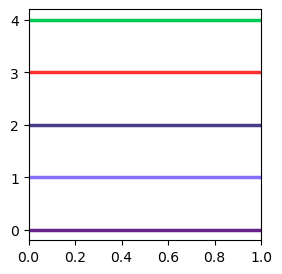

In [2]:
# color selection

# colors = [ 8d4j_1,    8d4j_2,    8d4j_3,    7vh8,    6xhu] 
new_cmap = ['#68228B','#8470FF','#483D8B', '#FF3030', '#00C957' ]
rtg_r = LinearSegmentedColormap.from_list("rtg", new_cmap)
colors = rtg_r(np.linspace(0,1,5))

#Test colormap
fig = plt.figure(figsize=(3,3))

for i,color in enumerate(colors):
    plt.axhline(i, color=colors[i], linewidth=2.5)

In [3]:
datadir = os.getcwd()

data3 = datadir+'/3rd_simulation_600ns'
data4 = datadir+'/4th_simulation_600ns'
data5 = datadir+'/5th_simulation_600ns'

data_7vh8 = datadir+'/../WT_7VH8/'
data_6xhu = datadir+'/../WT_6XHU/'

#import data for the universe - same npt file for all 3 simulations
GRO_8D4J = data3+'/3_NPT/npt.gro'
GRO_7VH8 = data_7vh8+'/5_NPT/npt.gro'
GRO_6XHU = data_6xhu+'/3_NPT/npt.gro'

# aligned universe equilibrated
al_8d4j_3_eq = mda.Universe(GRO_8D4J, str(data3+'/4_run/aligned_traj_eq.xtc'))
al_8d4j_4_eq = mda.Universe(GRO_8D4J, str(data4+'/4_run/aligned_traj_eq.xtc'))
al_8d4j_5_eq = mda.Universe(GRO_8D4J, str(data5+'/4_run/aligned_traj_eq.xtc'))
al_7vh8_eq = mda.Universe(GRO_7VH8, str(data_7vh8+'/6_run/aligned_traj_eq.xtc'))
al_6xhu_eq = mda.Universe(GRO_6XHU, str(data_6xhu+'/4_run/aligned_traj_eq.xtc'))

# full protein with CA selection
RMSD_CA_3_EQ = data3+'/4_run/data/rmsd/rmsd_ca_eq.dat'
RMSD_CA_4_EQ = data4+'/4_run/data/rmsd/rmsd_ca_eq.dat'
RMSD_CA_5_EQ = data5+'/4_run/data/rmsd/rmsd_ca_eq.dat'
RMSD_CA_7VH8_EQ = data_7vh8+'/6_run/data/rmsd/rmsd_ca_eq.dat'
RMSD_CA_6XHU_EQ = data_6xhu+'/4_run/data/rmsd/rmsd_ca_eq.dat'

rmsd_ca_3_eq = pd.read_csv(RMSD_CA_3_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ca_4_eq = pd.read_csv(RMSD_CA_4_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ca_5_eq = pd.read_csv(RMSD_CA_5_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ca_7vh8_eq = pd.read_csv(RMSD_CA_7VH8_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ca_6xhu_eq = pd.read_csv(RMSD_CA_6XHU_EQ, sep='\s+', header=None,usecols = [0,1,2])

# chain1 and chain2 with CA selection 
RMSD_CH1_3_EQ = data3+'/4_run/data/rmsd/rmsd_ch1_eq.dat'
RMSD_CH2_3_EQ = data3+'/4_run/data/rmsd/rmsd_ch2_eq.dat'
RMSD_CH1_4_EQ = data4+'/4_run/data/rmsd/rmsd_ch1_eq.dat'
RMSD_CH2_4_EQ = data4+'/4_run/data/rmsd/rmsd_ch2_eq.dat'
RMSD_CH1_5_EQ = data5+'/4_run/data/rmsd/rmsd_ch1_eq.dat'
RMSD_CH2_5_EQ = data5+'/4_run/data/rmsd/rmsd_ch2_eq.dat'
RMSD_CH1_7VH8_EQ = data_7vh8+'/6_run/data/rmsd/rmsd_ch1_eq.dat'
RMSD_CH2_7VH8_EQ = data_7vh8+'/6_run/data/rmsd/rmsd_ch2_eq.dat'


rmsd_ch1_3_eq = pd.read_csv(RMSD_CH1_3_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch2_3_eq = pd.read_csv(RMSD_CH2_3_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch1_4_eq = pd.read_csv(RMSD_CH1_4_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch2_4_eq = pd.read_csv(RMSD_CH2_4_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch1_5_eq = pd.read_csv(RMSD_CH1_5_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch2_5_eq = pd.read_csv(RMSD_CH2_5_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch1_7vh8_eq = pd.read_csv(RMSD_CH1_7VH8_EQ, sep='\s+', header=None,usecols = [0,1,2])
rmsd_ch2_7vh8_eq = pd.read_csv(RMSD_CH2_7VH8_EQ, sep='\s+', header=None,usecols = [0,1,2])

## 8D4J - 1

In [4]:
import seaborn as sns

# ------------------------- CA -----------------------------------

PAIR_RMSD_3 = data3+'/4_run/data/pair_rmsd/pair_rmsd_ca.dat'

df = pd.read_csv(PAIR_RMSD_3, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 4001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq = rmsd_mat_half[4001:, 4001:]


# ------------------------- chain 1 -----------------------------------
PAIR_RMSD_3_CH1 = data3+'/4_run/data/pair_rmsd/pair_rmsd_ca_ch1.dat'

df = pd.read_csv(PAIR_RMSD_3_CH1, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 4001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq_ch1 = rmsd_mat_half[4001:, 4001:]

# ------------------------- chain 2 -----------------------------------
PAIR_RMSD_3_CH2 = data3+'/4_run/data/pair_rmsd/pair_rmsd_ca_ch2.dat'

df = pd.read_csv(PAIR_RMSD_3_CH2, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 4001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq_ch2 = rmsd_mat_half[4001:, 4001:]

### Linkage

In [ ]:

Z = linkage(rmsd_mat_eq, 'average')
Z_ch1 = linkage(rmsd_mat_eq_ch1, 'average')
Z_ch2 = linkage(rmsd_mat_eq_ch2, 'average')

np.save(data3+'/4_run/data/clustering/Z', Z)
np.save(data3+'/4_run/data/clustering/Z_ch1', Z_ch1)
np.save(data3+'/4_run/data/clustering/Z_ch2', Z_ch2)

In [31]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

sc.cluster.hierarchy.set_link_color_palette(None)
#[new_cmap[2], new_cmap[4], new_cmap[6]]
Z = np.load(data3+'/4_run/data/clustering/Z.npy')
Z_ch1 = np.load(data3+'/4_run/data/clustering/Z_ch1.npy')
Z_ch2 = np.load(data3+'/4_run/data/clustering/Z_ch2.npy')

### Dendrogram

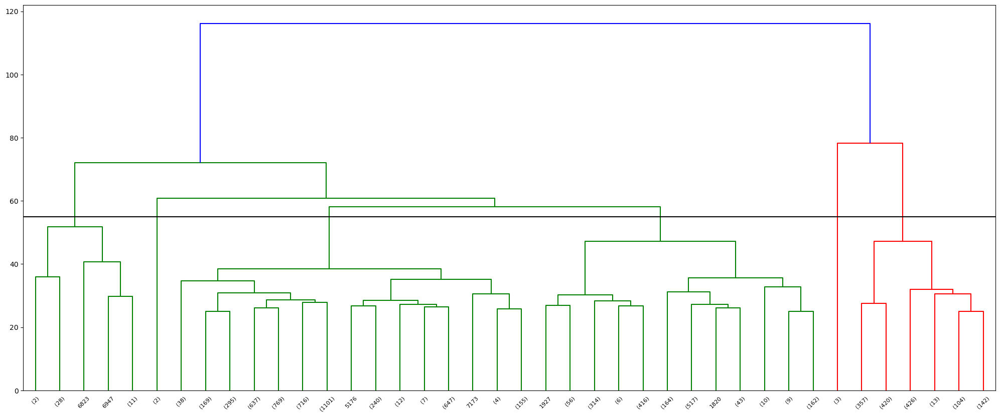

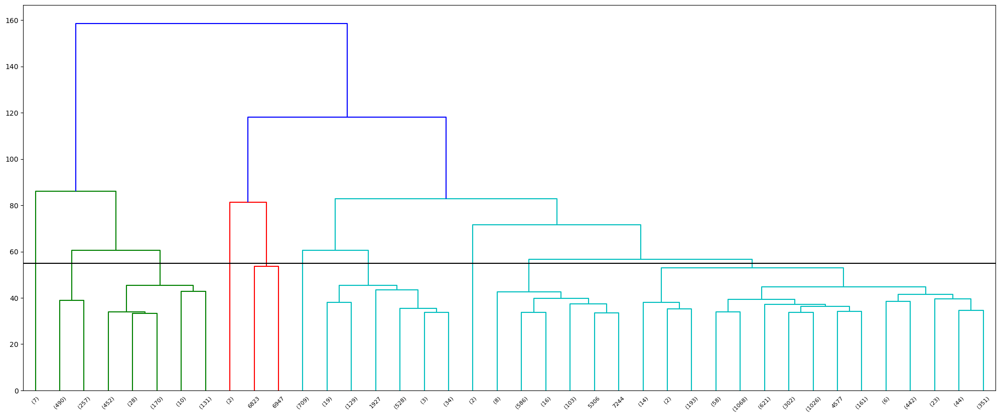

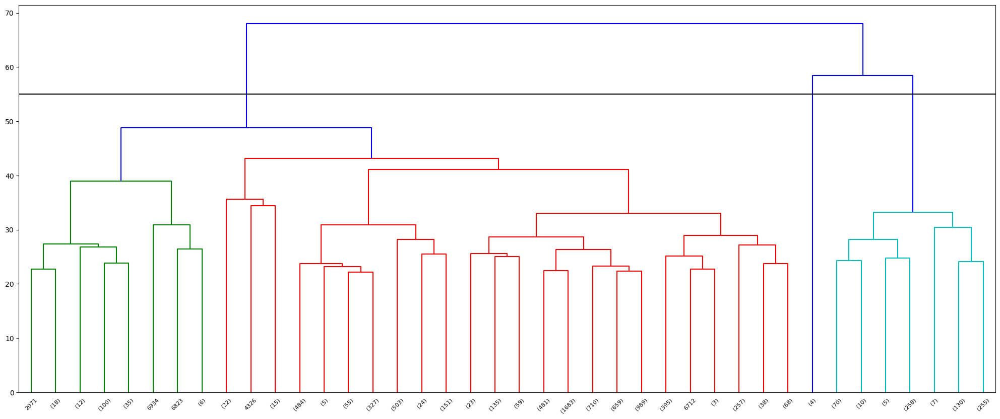

In [32]:
height = 55

# -------------------- CA --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)
# -------------------- chain 1 --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z_ch1, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)
# -------------------- chain 2 --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z_ch2, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)

### fcluster

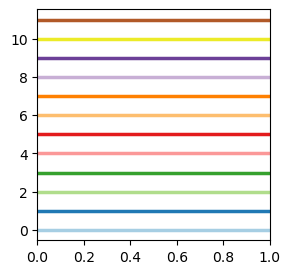

In [27]:
new_cmap = ['#A6CEE3','#1F78B4','#B2DF8A','#33A02C','#FB9A99','#E31A1C','#FDBF6F','#FF7F00','#CAB2D6','#6A3D9A','#ECEC28','#B15928']
rtg_r = LinearSegmentedColormap.from_list("rtg", new_cmap)
col= rtg_r(np.linspace(0,1,12))

#Test colormap
fig = plt.figure(figsize=(3,3))

for i,color in enumerate(col):
    plt.axhline(i, color=col[i], linewidth=2.5)

In [92]:
cl_distance = height
cl_labels = fcluster(Z, t=cl_distance, criterion='distance')
cl_labels_ch1 = fcluster(Z_ch1, t=cl_distance, criterion='distance')
cl_labels_ch2 = fcluster(Z_ch2, t=cl_distance, criterion='distance')

np.save(data3+'/4_run/data/clustering/cl_labels', cl_labels)
np.save(data3+'/4_run/data/clustering/cl_labels_ch1', cl_labels_ch1)
np.save(data3+'/4_run/data/clustering/cl_labels_ch2', cl_labels_ch2)

In [93]:
print('CA:', np.unique(cl_labels))
print('chain 1:', np.unique(cl_labels_ch1))
print('chain 2:', np.unique(cl_labels_ch2))

CA: [1 2 3 4 5 6 7 8 9]
chain 1: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
chain 2: [1 2 3 4 5 6]


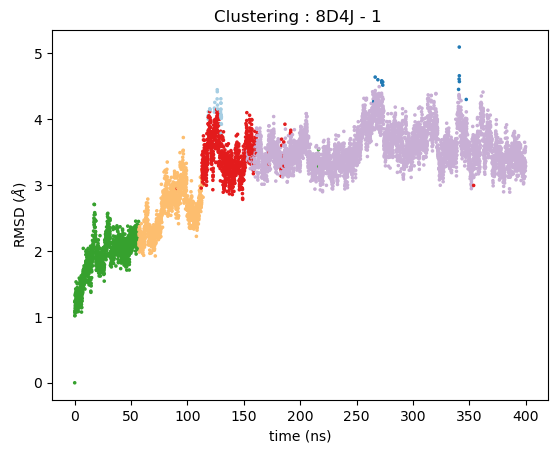

In [94]:

classes3 = np.unique(cl_labels)

color = []
col_lab = ['group 1', 'group 2', 'group 3', 'group 4', 'group 5', 'group 6']
labell = []

for ii in range(len(cl_labels)):
    if(cl_labels[ii] == 1):
        cc = col[0]
    elif (cl_labels[ii] == 2):
        cc = col[1]
    elif (cl_labels[ii] == 3):
        cc = col[3]
    elif (cl_labels[ii] == 4):
        cc = col[8]
    elif (cl_labels[ii] == 5):
        cc = col[6]
    elif (cl_labels[ii] == 6):
        cc = col[5]
    color.append(cc)

time = rmsd_ca_3_eq[1]/1e3 # time in [ns]
time = time - time[0]
plt.scatter(time, rmsd_ca_3_eq[2],  c = color, marker = '.', s = 10)
#plt.legend(np.arange(500)+1, bbox_to_anchor=(1, 0.9), loc=2, title='Groups')
plt.xlabel('time (ns)')
plt.ylabel('RMSD ($\AA$)')
plt.title('Clustering : 8D4J - 1 ')


#plt.grid(color = '#DCDCDC', lw = 0.5)
#scatter = plt.scatter(time, rmsd_ca[2], c=cl_labels, marker = '.' )

plt.show()

## 8D4J - 2

In [10]:
PAIR_RMSD_4 = data4+'/4_run/data/pair_rmsd/pair_rmsd_ca.dat'

df = pd.read_csv(PAIR_RMSD_4, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 2001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq = rmsd_mat_half[2001:, 2001:]

In [ ]:
# linkage
Z4 = linkage(rmsd_mat_eq, 'average')

np.save(data4+'/4_run/data/clustering/Z', Z4)

/var/folders/tm/kk675_9j3_jdym5wf5p32tgm0000gn/T/ipykernel_25202/902607995.py:2: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



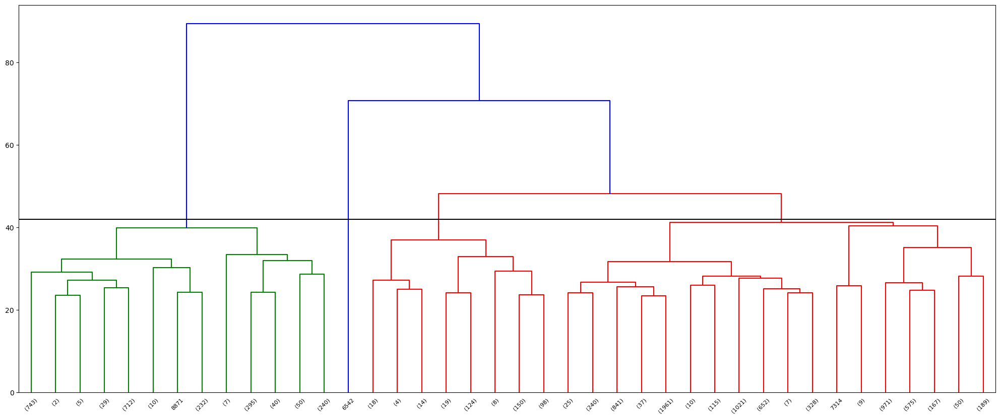

In [100]:
# dendrogram
height = 42
Z4 = np.load(data4+'/4_run/data/clustering/Z.npy')
# -------------------- CA --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z4, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)

In [101]:
# fcluster
cl_distance = height
cl_labels4 = fcluster(Z4, t=cl_distance, criterion='distance')

np.save(data4+'/4_run/data/clustering/cl_labels', cl_labels4)

print('CA:', np.unique(cl_labels4))

CA: [1 2 3 4]


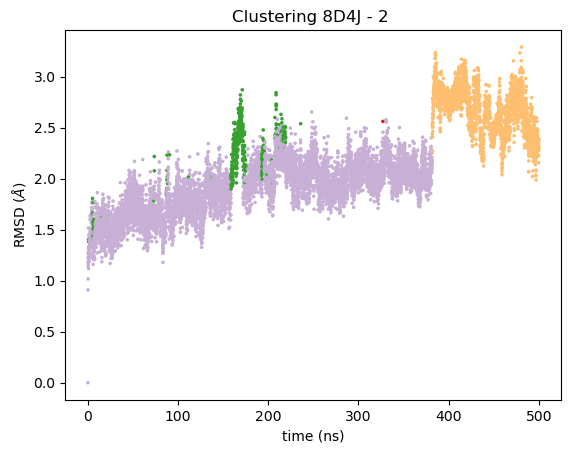

In [102]:

classes4 = np.unique(cl_labels4)

color = []
col_lab = ['group 1', 'group 2', 'group 3', 'group 4']

for ii in range(len(cl_labels4)):
    if(cl_labels4[ii] == 1):
        cc = col[6]
    elif (cl_labels4[ii] == 2):
        cc = col[3]
    elif (cl_labels4[ii] == 3):
        cc = col[8]
    elif (cl_labels4[ii] == 4):
        cc = col[5]
    elif (cl_labels4[ii] == 5):
        cc = col[7]
    elif (cl_labels4[ii] == 5):
        cc = col[1]
    color.append(cc)

time = rmsd_ca_4_eq[1]/1e3 # time in [ns]
time = time - time[0]
plt.scatter(time, rmsd_ca_4_eq[2],  c = color, marker = '.', s = 10)
plt.xlabel('time (ns)')
plt.ylabel('RMSD ($\AA$)')
plt.title('Clustering 8D4J - 2 ')


#plt.grid(color = '#DCDCDC', lw = 0.5)
#scatter = plt.scatter(time, rmsd_ca[2], c=cl_labels, marker = '.' )

plt.show()

## 8D4J - 3

In [14]:
PAIR_RMSD_5 = data5+'/4_run/data/pair_rmsd/pair_rmsd_ca.dat'

df = pd.read_csv(PAIR_RMSD_5, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 2001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq = rmsd_mat_half[2001:, 2001:]

In [15]:
# linkage
Z5 = linkage(rmsd_mat_eq, 'average')

np.save(data5+'/4_run/data/clustering/Z', Z5)

/var/folders/tm/kk675_9j3_jdym5wf5p32tgm0000gn/T/ipykernel_16267/3838217647.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z5 = linkage(rmsd_mat_eq, 'average')


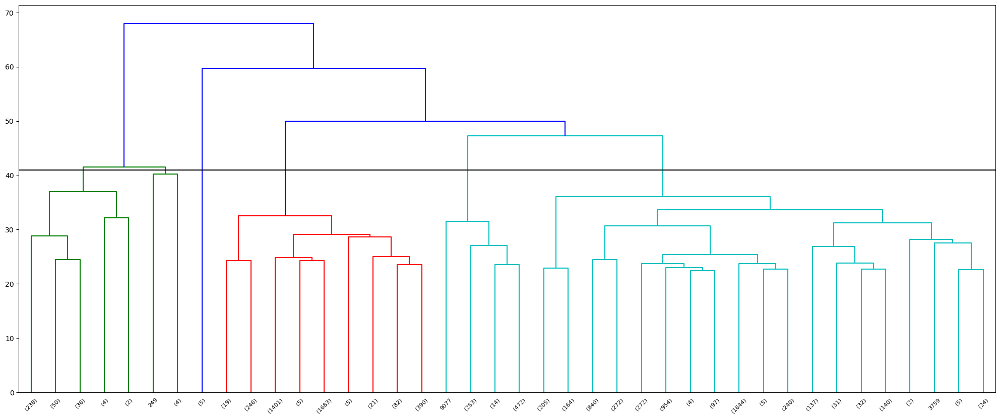

In [85]:
# dendrogram
height = 41
Z5 = np.load(data5+'/4_run/data/clustering/Z.npy')
# -------------------- CA --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z5, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)

In [86]:
# fcluster
cl_distance = height
cl_labels5 = fcluster(Z5, t=cl_distance, criterion='distance')

np.save(data5+'/4_run/data/clustering/cl_labels', cl_labels5)

print('CA:', np.unique(cl_labels5))

CA: [1 2 3 4 5 6]


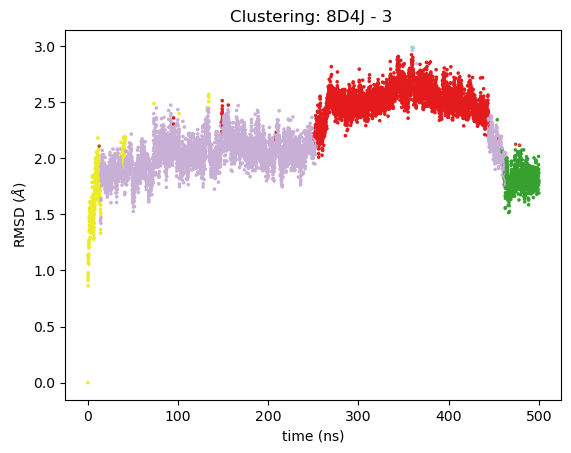

In [91]:

classes5 = np.unique(cl_labels5)

color = []
col_lab = ['group 1', 'group 2', 'group 3', 'group 4', 'group 5']

for ii in range(len(cl_labels5)):
    if(cl_labels5[ii] == 1):
        cc = col[10]
    elif (cl_labels5[ii] == 2):
        cc = col[11]
    elif (cl_labels5[ii] == 3):
        cc = col[0]
    elif (cl_labels5[ii] == 4):
        cc = col[5]
    elif (cl_labels5[ii] == 5):
        cc = col[3]
    elif (cl_labels5[ii] == 6):
        cc = col[8]
    color.append(cc)

time = rmsd_ca_5_eq[1]/1e3 # time in [ns]
time = time - time[0]
plt.scatter(time, rmsd_ca_5_eq[2],  c = color, marker = '.', s = 10)
plt.xlabel('time (ns)')
plt.ylabel('RMSD ($\AA$)')
plt.title('Clustering: 8D4J - 3 ')


#plt.grid(color = '#DCDCDC', lw = 0.5)
#scatter = plt.scatter(time, rmsd_ca[2], c=cl_labels, marker = '.' )

plt.show()

# 7VH8

In [15]:
# 7VH8 
PAIR_RMSD_7VH8 = data_7vh8+'/6_run/data/pair_rmsd/pair_rmsd_ca.dat'

df = pd.read_csv(PAIR_RMSD_7VH8, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 4001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq = rmsd_mat_half[4001:, 4001:]

In [16]:
# linkage
Z7 = linkage(rmsd_mat_eq, 'average')

np.save(data_7vh8+'/6_run/data/clustering/Z', Z7)

/var/folders/tm/kk675_9j3_jdym5wf5p32tgm0000gn/T/ipykernel_26204/1919855024.py:2: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



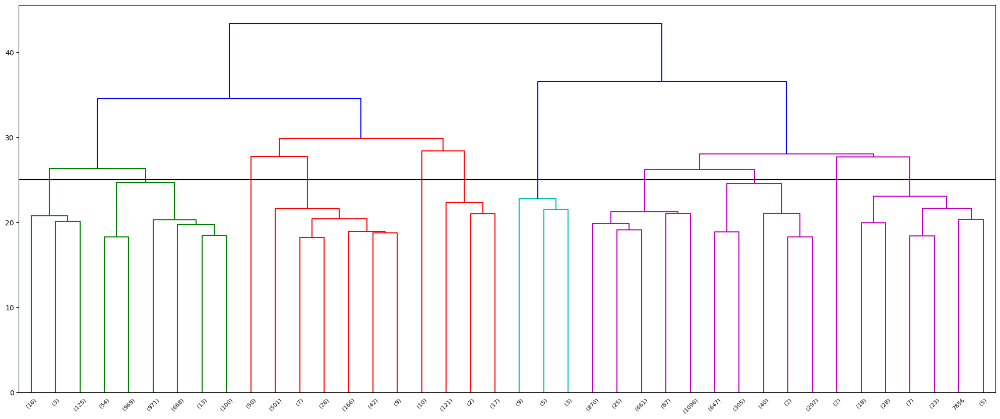

In [112]:
# dendrogram
height = 25
Z7 = np.load(data_7vh8+'/6_run/data/clustering/Z.npy')
# -------------------- CA --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z7, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)

In [113]:
# fcluster
cl_distance = height
cl_labels7 = fcluster(Z7, t=cl_distance, criterion='distance')

np.save(data_7vh8+'/6_run/data/clustering/cl_labels', cl_labels7)

print('CA:', np.unique(cl_labels7))

CA: [ 1  2  3  4  5  6  7  8  9 10 11]


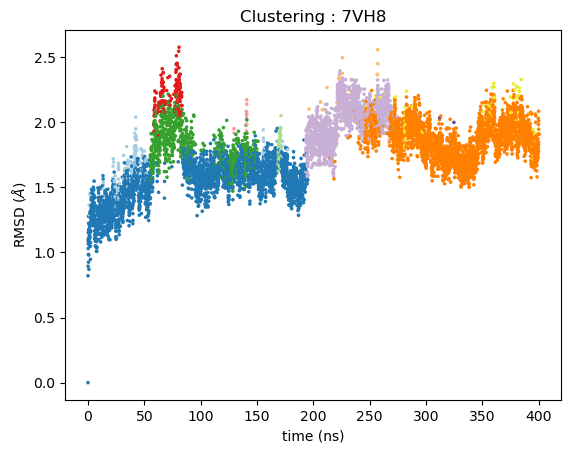

In [114]:

classes7 = np.unique(cl_labels7)

color = []
col_lab = ['group 1', 'group 2', 'group 3', 'group 4']

for ii in range(len(cl_labels7)):
    if(cl_labels7[ii] == 1):
        cc = col[0]
    elif (cl_labels7[ii] == 2):
        cc = col[1]
    elif (cl_labels7[ii] == 3):
        cc = col[2]
    elif (cl_labels7[ii] == 4):
        cc = col[3]
    elif (cl_labels7[ii] == 5):
        cc = col[4]
    elif (cl_labels7[ii] == 6):
        cc = col[5]
    elif (cl_labels7[ii] == 7):
        cc = col[6]
    elif (cl_labels7[ii] == 8):
        cc = col[7]
    elif (cl_labels7[ii] == 9):
        cc = col[8]
    elif (cl_labels7[ii] == 10):
        cc = col[9]
    elif (cl_labels7[ii] == 11):
        cc = col[10]
    color.append(cc)

time = rmsd_ca_7vh8_eq[1]/1e3 # time in [ns]
time = time - time[0]
plt.scatter(time, rmsd_ca_7vh8_eq[2],  c = color, marker = '.', s = 10)
plt.xlabel('time (ns)')
plt.ylabel('RMSD ($\AA$)')
plt.title('Clustering : 7VH8')



#plt.grid(color = '#DCDCDC', lw = 0.5)
#scatter = plt.scatter(time, rmsd_ca[2], c=cl_labels, marker = '.' )

plt.show()

In [107]:
# 6XHU
PAIR_RMSD_6XHU = data_6xhu+'/4_run/data/pair_rmsd/pair_rmsd_ca.dat'

df = pd.read_csv(PAIR_RMSD_6XHU, sep='\s+', header=None, usecols = [0,1,2], names = ['traj1', 'traj2', 'RMSD'])

# convert df in matrix
matrix = np.array(df)

rmsd_mat_half = np.zeros((12002,12002))
l = 72030003 # range(0,3) = 0,1,2
for i in range(0,l):
    rmsd_mat_half[int(matrix[i,0]),int(matrix[i,1])] = matrix[i,2]
    
# copy the tridiagonal inferior part of the matrix with respect to the diagonal
start_frame = 2001
for i in range(start_frame,12002):
    for j in range(0,i):
        rmsd_mat_half[j,i] = rmsd_mat_half[i,j]
        
rmsd_mat_eq = rmsd_mat_half[2001:, 2001:]

In [14]:
# linkage
Z6 = linkage(rmsd_mat_eq, 'average')

np.save(data_6xhu+'/4_run/data/clustering/Z', Z6)

/var/folders/tm/kk675_9j3_jdym5wf5p32tgm0000gn/T/ipykernel_67837/2476756376.py:2: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



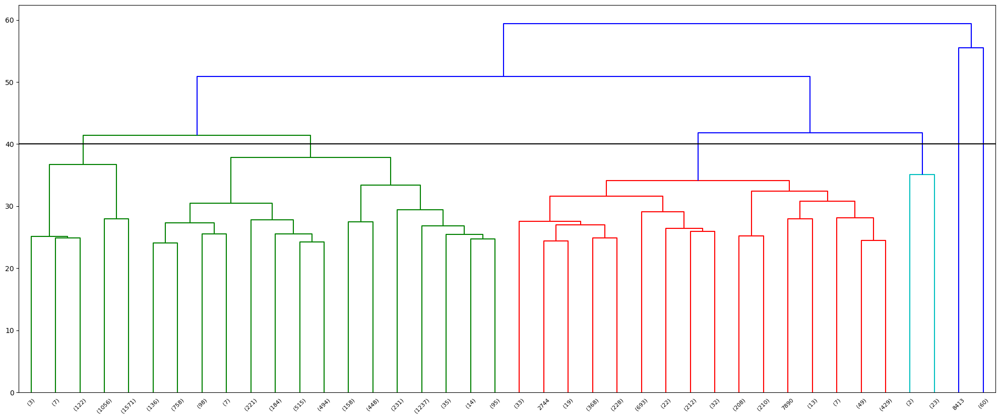

In [18]:
# dendrogram
height = 40
Z6 = np.load(data_6xhu+'/4_run/data/clustering/Z.npy')
# -------------------- CA --------------------
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z6, p = 40,truncate_mode = 'lastp')
plt.hlines(y=height, xmin=0, xmax = 10000)

In [19]:
# fcluster
cl_distance = height
cl_labels6 = fcluster(Z6, t=cl_distance, criterion='distance')

np.save(data_6xhu+'/4_run/data/clustering/cl_labels', cl_labels6)

print('CA:', np.unique(cl_labels6))

CA: [1 2 3 4 5 6]


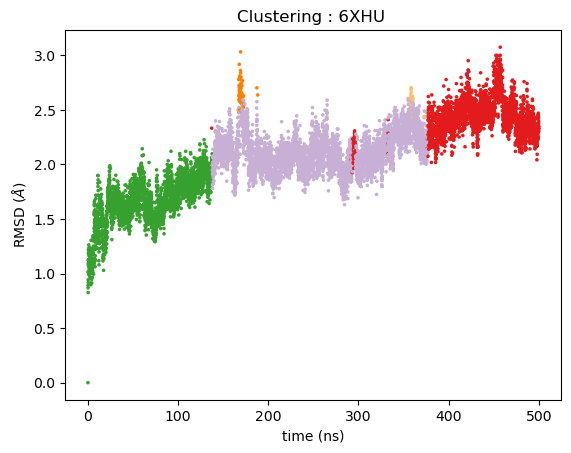

In [29]:
classes6 = np.unique(cl_labels6)

color = []
col_lab = ['group 1', 'group 2', 'group 3', 'group 4', 'group 5', 'group 6']

for ii in range(len(cl_labels6)):
    if(cl_labels6[ii] == 1):
        cc = col[3]
    elif (cl_labels6[ii] == 2):
        cc = col[8]
    elif (cl_labels6[ii] == 3):
        cc = col[5]
    elif (cl_labels6[ii] == 4):
        cc = col[6]
    elif (cl_labels6[ii] == 5):
        cc = col[7]
    elif (cl_labels6[ii] == 6):
        cc = col[9]
    color.append(cc)

time = rmsd_ca_6xhu_eq[1]/1e3 # time in [ns]
time = time - time[0]
plt.scatter(time, rmsd_ca_6xhu_eq[2],  c = color, marker = '.', s = 10)
plt.xlabel('time (ns)')
plt.ylabel('RMSD ($\AA$)')
plt.title('Clustering : 6XHU ')



#plt.grid(color = '#DCDCDC', lw = 0.5)
#scatter = plt.scatter(time, rmsd_ca[2], c=cl_labels, marker = '.' )

plt.show()

# PCA
Now I focus on 8D4J - 1 to try to understand which information I can gain by combining clustering technique and PCA. 


In [4]:
import MDAnalysis.analysis.pca as pca
from MDAnalysis.analysis.pca import PCA, cosine_content

# RMSF per residue projected onto the first PC

### mode 1

In [71]:
#8D4J - 1

#gmx covar -f aligned_traj_eq.xtc -s ../3_NPT/npt.gro -v eigenvec.trr -o eigenval.xvg -ascii covar.dat  
#gmx anaeig -v eigenvec.trr -f aligned_traj_eq.xtc -s ../3_NPT/npt.gro -eig eigenval.xvg -rmsf rmsf.xvg -entropy
#plot the RMS fluctuation per atom of eigenvectors -first
# The RMSF per residue of the first PC is calculated using gromacs. 

datadir = os.getcwd()
# -------------------- 8D4J -----------------------
data3 = datadir+'/3rd_simulation_600ns'
data4 = datadir+'/4th_simulation_600ns'
data5 = datadir+'/5th_simulation_600ns'

data_7vh8 = datadir+'/../WT_7VH8/'
data_6xhu = datadir+'/../WT_6XHU/'

RMSF_EIG_3 = data3+'/4_run/rmsf.xvg'
RMSF_EIG_4 = data4+'/4_run/rmsf.xvg'
RMSF_EIG_5 = data5+'/4_run/rmsf.xvg'
RMSF_EIG_7 = data_7vh8+'/6_run/rmsf.xvg'
RMSF_EIG_7_2 = data_7vh8+'/6_run/rmsf_2.xvg'
RMSF_EIG_6 = data_6xhu+'/4_run/rmsf.xvg'
RMSF_EIG_6_2 = data_6xhu+'/4_run/rmsf_2.xvg'


eig_3_df=pd.read_csv(RMSF_EIG_3, sep='\s+', header=None, names=['residue','rmsf'])
eig_4_df=pd.read_csv(RMSF_EIG_4, sep='\s+', header=None, names=['resudue','rmsf'])
eig_5_df=pd.read_csv(RMSF_EIG_5, sep='\s+', header=None, names=['residue','rmsf'])
eig_7vh8_df=pd.read_csv(RMSF_EIG_7, sep='\s+', header=None, names=['residue','rmsf'])
eig_7vh82_df=pd.read_csv(RMSF_EIG_7_2, sep='\s+', header=None, names=['residue','rmsf'])
eig_6xhu_df=pd.read_csv(RMSF_EIG_6, sep='\s+', header=None, names=['residue','rmsf'])
eig_6xhu2_df=pd.read_csv(RMSF_EIG_6_2, sep='\s+', header=None, names=['residue','rmsf'])

eig_3 = eig_3_df.to_numpy()
eig_4 = eig_4_df.to_numpy()
eig_5 = eig_5_df.to_numpy()
eig_7vh8 = eig_7vh8_df.to_numpy()
eig_7vh8_2 = eig_7vh82_df.to_numpy()
eig_6xhu = eig_6xhu_df.to_numpy()
eig_6xhu_2 = eig_6xhu2_df.to_numpy()

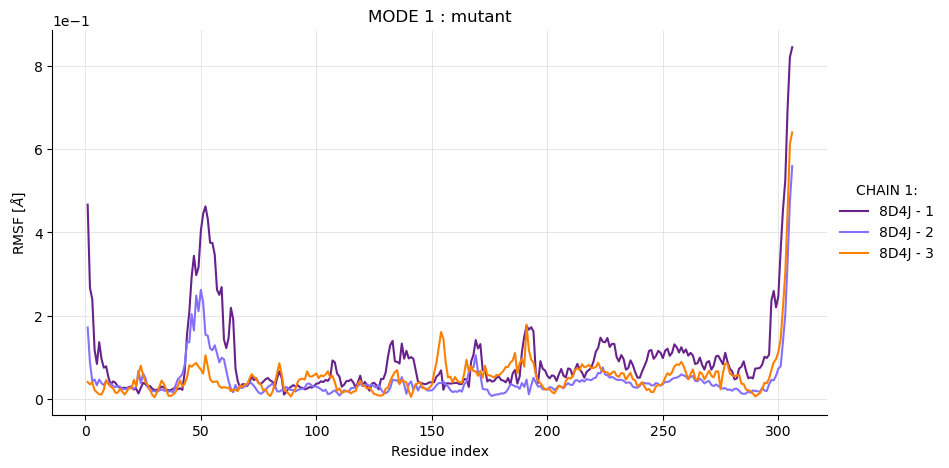

In [28]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)

ax.plot(eig_3[:306,0], eig_3[:306,1] ,color = colors[0], label = "8D4J - 1") 
ax.plot(eig_4[:306,0], eig_4[:306,1] ,color = colors[1], label = "8D4J - 2") 
ax.plot(eig_5[:306,0], eig_5[:306,1] ,color = col[7], label = "8D4J - 3") 
#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 1 : mutant')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 1:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


In [36]:
print(eig_3[307])

[3.0800e+02 1.0068e-01]


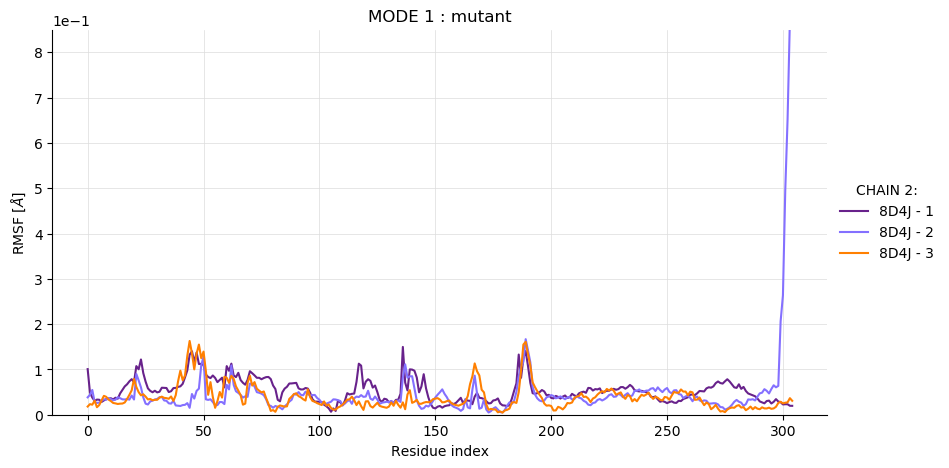

In [40]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)
 

ax.plot(eig_3[307:,0]-eig_3[307,0], eig_3[307:,1] ,color = colors[0], label = "8D4J - 1") 
ax.plot(eig_4[307:,0]-eig_4[307,0], eig_4[307:,1] ,color = colors[1], label = "8D4J - 2") 
ax.plot(eig_5[307:,0]-eig_5[307,0], eig_5[307:,1] ,color = col[7], label = "8D4J - 3") 
#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 1 : mutant')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.set_ylim([0,0.85])

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 2:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

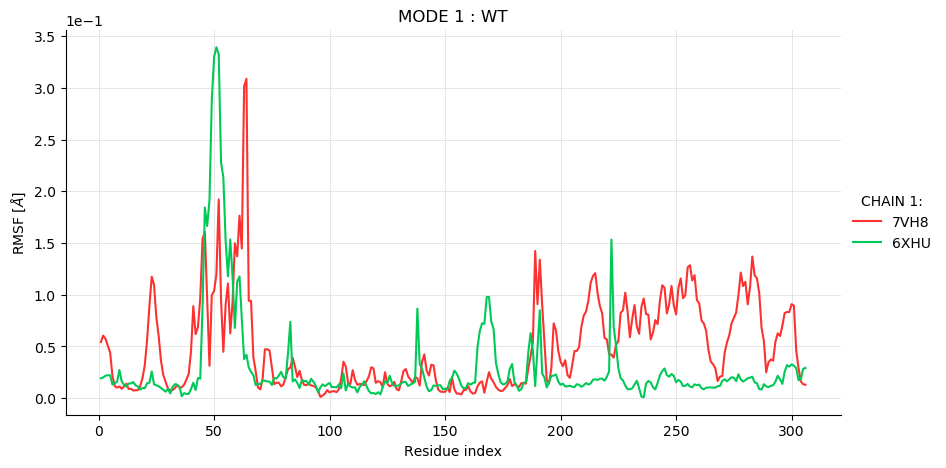

In [31]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)

ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 
#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 1 : WT')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 1:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

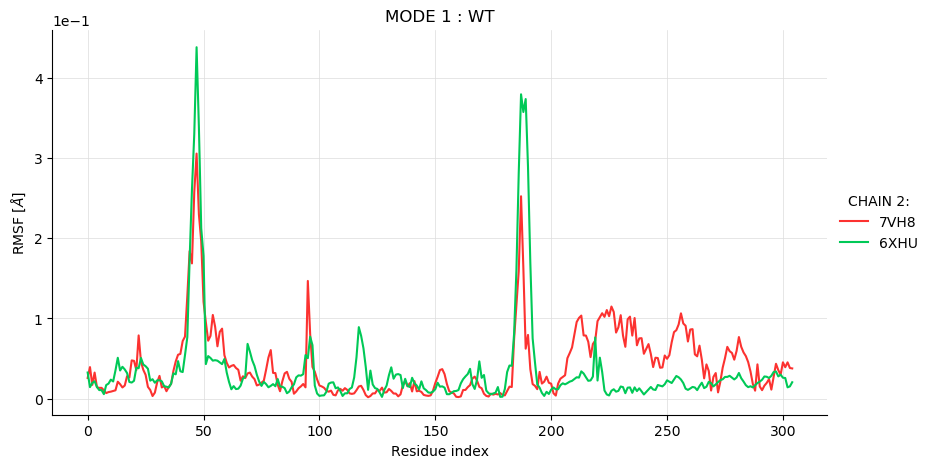

In [41]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)

ax.plot(eig_7vh8[307:,0]- eig_7vh8[307,0], eig_7vh8[307:,1] ,color = colors[3], label = "7VH8") 
ax.plot(eig_6xhu[307:,0]- eig_6xhu[307,0], eig_6xhu[307:,1] ,color = colors[4], label = "6XHU") 
#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 1 : WT')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 2:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

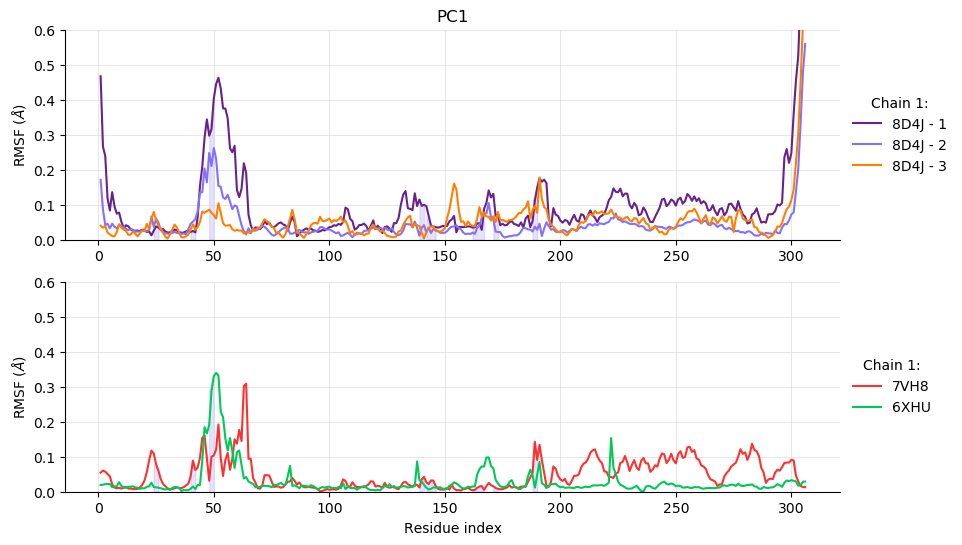

In [76]:
f = plt.figure(figsize=(10,6))
# chian 1 mutant
ax1 = f.add_subplot(211)
ax1.plot(eig_3[:306,0], eig_3[:306,1] ,color = colors[0], label = "8D4J - 1") 
ax1.plot(eig_4[:306,0], eig_4[:306,1] ,color = colors[1], label = "8D4J - 2") 
ax1.plot(eig_5[:306,0], eig_5[:306,1] ,color = col[7], label = "8D4J - 3")  
leg = ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5),title="Chain 1:")
leg.get_frame().set_linewidth(0.0)
ax1.grid(color = '#DCDCDC', lw = 0.5)
ax1.set_ylabel(r"RMSF ($\AA$)")
ax1.set_ylim([0,0.6])
ax1.set_title('PC1')

# chain 1 wt
ax2 = f.add_subplot(212)
ax2.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
ax2.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 
leg = ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Chain 1:")
ax2.grid(color = '#DCDCDC', lw = 0.5)
leg.get_frame().set_linewidth(0.0)
ax2.set_xlabel("Residue index")
ax2.set_ylabel(r"RMSF ($\AA$)")
ax2.set_ylim([0,0.6])

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax1.fill_between(np.linspace(24,26,2), eig_3[24:26,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(40,42,2), eig_3[40:42,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(48,50,2), eig_3[48:50,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(139,141,2), eig_3[139:141,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(142,146,4), eig_3[142:146,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(162,167,5), eig_3[162:167,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(171,173,2), eig_3[171:173,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(188,190,2), eig_3[188:190,1], color = colors[1], alpha = 0.2)


ax2.fill_between(np.linspace(24,26,2), eig_7vh8[24:26,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(40,42,2), eig_7vh8[40:42,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(48,50,2), eig_6xhu[48:50,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(139,141,2), eig_7vh8[139:141,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(142,146,4), eig_7vh8[142:146,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(162,167,5), eig_7vh8[162:167,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(171,173,2), eig_7vh8[171:173,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(188,190,2), eig_7vh8[188:190,1], color = colors[1], alpha = 0.2)

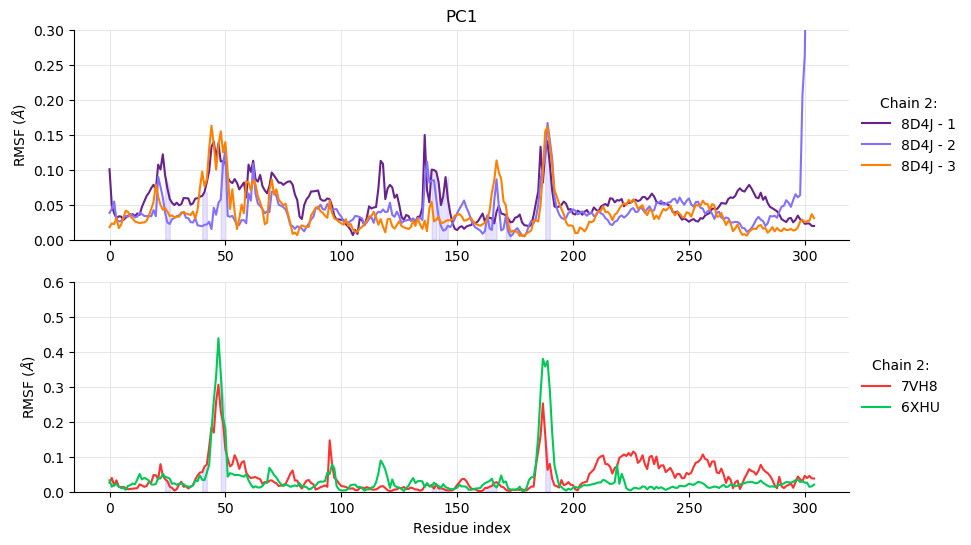

In [75]:
f = plt.figure(figsize=(10,6))
# chian 2 mutant
ax1 = f.add_subplot(211)
ax1.plot(eig_3[307:,0]-eig_3[307,0], eig_3[307:,1] ,color = colors[0], label = "8D4J - 1") 
ax1.plot(eig_4[307:,0]-eig_4[307,0], eig_4[307:,1] ,color = colors[1], label = "8D4J - 2") 
ax1.plot(eig_5[307:,0]-eig_5[307,0], eig_5[307:,1] ,color = col[7], label = "8D4J - 3")  
leg = ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5),title="Chain 2:")
leg.get_frame().set_linewidth(0.0)
ax1.grid(color = '#DCDCDC', lw = 0.5)
ax1.set_ylabel(r"RMSF ($\AA$)")
ax1.set_ylim([0,0.3])
ax1.set_title('PC1')

# chain 2 wt
ax2 = f.add_subplot(212)
ax2.plot(eig_7vh8[307:,0]- eig_7vh8[307,0], eig_7vh8[307:,1] ,color = colors[3], label = "7VH8") 
ax2.plot(eig_6xhu[307:,0]- eig_6xhu[307,0], eig_6xhu[307:,1] ,color = colors[4], label = "6XHU") 
leg = ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Chain 2:")
ax2.grid(color = '#DCDCDC', lw = 0.5)
leg.get_frame().set_linewidth(0.0)
ax2.set_xlabel("Residue index")
ax2.set_ylabel(r"RMSF ($\AA$)")
ax2.set_ylim([0,0.6])

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

ax1.fill_between(np.linspace(24,26,2), eig_3[24+307:26+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(40,42,2), eig_3[40+307:42+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(48,50,2), eig_3[48+307:50+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(139,141,2), eig_3[139+307:141+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(142,146,4), eig_3[142+307:146+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(162,167,5), eig_3[162+307:167+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(171,173,2), eig_3[171+307:173+307,1], color = colors[1], alpha = 0.2)
ax1.fill_between(np.linspace(188,190,2), eig_3[188+307:190+307,1], color = colors[1], alpha = 0.2)


ax2.fill_between(np.linspace(24,26,2), eig_7vh8[24+307:26+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(40,42,2), eig_7vh8[40+307:42+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(48,50,2), eig_6xhu[48+307:50+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(139,141,2), eig_7vh8[139+307:141+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(142,146,4), eig_7vh8[142+307:146+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(162,167,5), eig_7vh8[162+307:167+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(171,173,2), eig_7vh8[171+307:173+307,1], color = colors[1], alpha = 0.2)
ax2.fill_between(np.linspace(188,190,2), eig_7vh8[188+307:190+307,1], color = colors[1], alpha = 0.2)

### mode 2

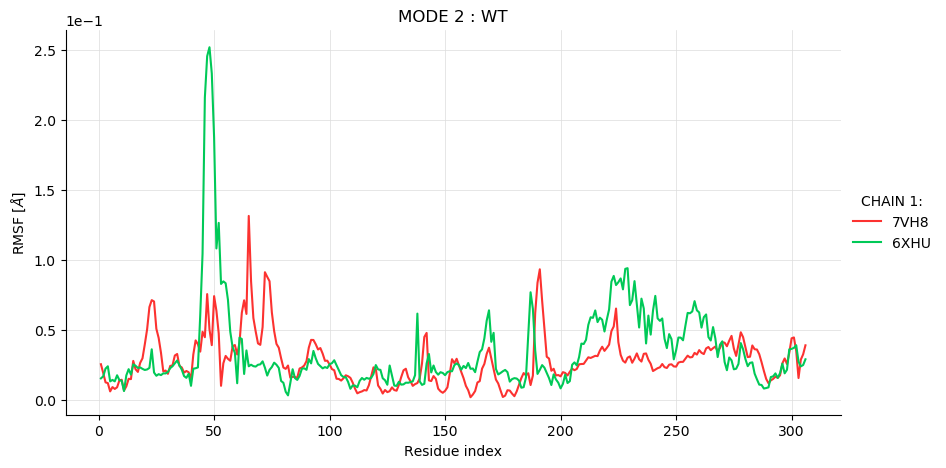

In [73]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)
ax.plot(eig_7vh8_2[:306,0], eig_7vh8_2[:306,1] ,color = colors[3], label = "7VH8") 
ax.plot(eig_6xhu_2[:306,0], eig_6xhu_2[:306,1] ,color = colors[4], label = "6XHU") 

#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 2 : WT')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 1:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

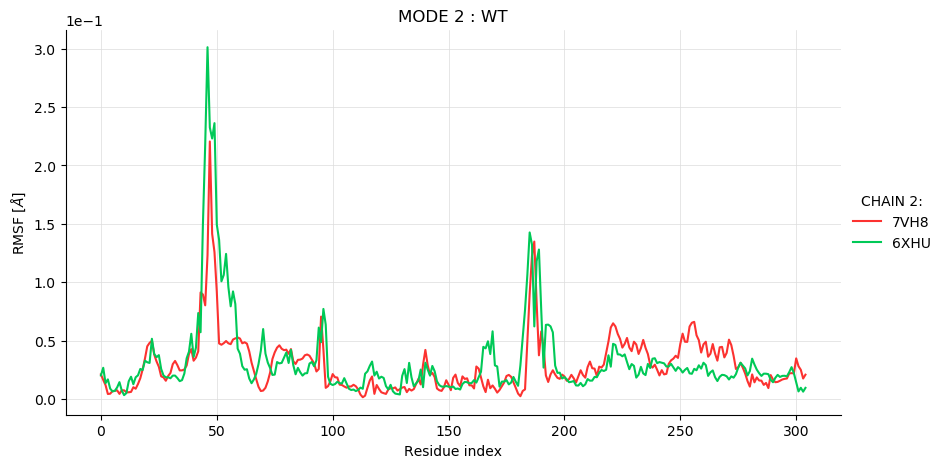

In [74]:
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(111)
#ax = plt.subplot(111)

ax.plot(eig_7vh8_2[307:,0]- eig_7vh8_2[307,0], eig_7vh8_2[307:,1] ,color = colors[3], label = "7VH8") 
ax.plot(eig_6xhu_2[307:,0]- eig_6xhu_2[307,0], eig_6xhu_2[307:,1] ,color = colors[4], label = "6XHU") 
#ax.plot(eig_7vh8[:306,0], eig_7vh8[:306,1] ,color = colors[3], label = "7VH8") 
#ax.plot(eig_6xhu[:306,0], eig_6xhu[:306,1] ,color = colors[4], label = "6XHU") 


ax.set_xlabel("Residue index")
ax.set_ylabel(r"RMSF [$\AA$]") 
ax.set_title('MODE 2 : WT')
ax.legend()
ax.grid(color = '#DCDCDC', lw = 0.5)
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

leg = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title = 'CHAIN 2:')
leg.get_frame().set_linewidth(0.0)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# 6XHU

In [6]:
# CA selection
pca_ca6 = pca.PCA(al_6xhu_eq, select='name CA') 
pca_ca6.run()


198


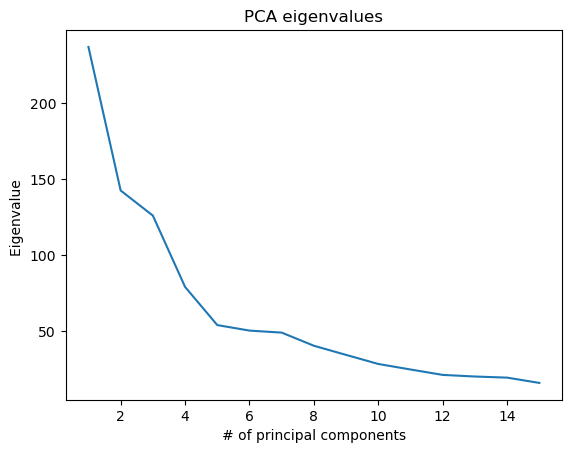

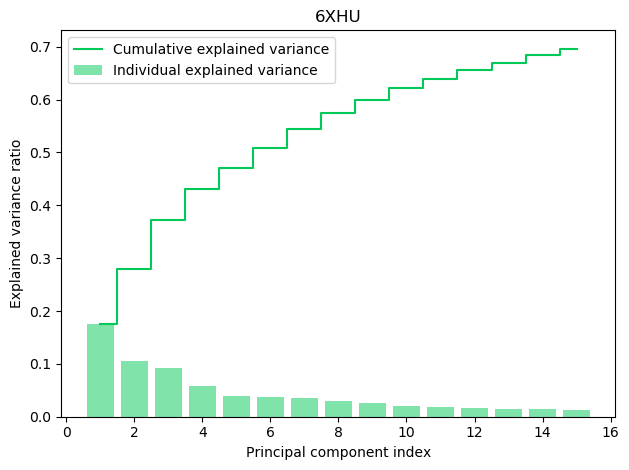

In [11]:
# cumulated variance
cumulat_var_pca_ca6 = pca_ca6.cumulated_variance 
n_pcs_ca = np.where(cumulat_var_pca_ca6 > 0.95)[0][0]
print(n_pcs_ca)
ca_sel6 = al_6xhu_eq.select_atoms('name CA')

max_pc = 15
plt.figure()
plt.plot(np.arange(0,max_pc)+1, pca_ca6.variance[0:max_pc])
plt.xlabel('# of principal components')
plt.ylabel('Eigenvalue ')
plt.title('PCA eigenvalues')


# total variance from all the PC
egnv_ca = pca_ca6.variance
tot_egnv_ca = sum(egnv_ca)

# explained variance for all PC : it is calculated as the ratio between the variance of each principal
# component over the total variance
var_exp = [(i/tot_egnv_ca) for i in sorted(egnv_ca, reverse=True)]

plt.figure()
plt.bar(np.arange(0,max_pc)+1, var_exp[:max_pc], alpha=0.5, color = colors[4],align='center', label='Individual explained variance')
plt.step(np.arange(0,max_pc)+1, cumulat_var_pca_ca6[:max_pc], where='mid',label='Cumulative explained variance', color = colors[4])
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('6XHU')
plt.legend(loc='best')
plt.tight_layout()
plt.show()





In [13]:
for i in range(3):
    print(i, f"CA - Cumulated variance: {cumulat_var_pca_ca6[i]:.3f}")
print()

0 CA - Cumulated variance: 0.175
1 CA - Cumulated variance: 0.280
2 CA - Cumulated variance: 0.373



In [12]:
pca_space_ca6 = pca_ca6.transform(al_6xhu_eq.select_atoms('name CA'), n_components = 3) 

In [14]:
pca_data_ca6 = pd.DataFrame(pca_space_ca6,columns=['first_comp','second_comp','third_comp'])
df_ca6 = pca_data_ca6
n_components = 3

components = pca_space_ca6

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
#labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    color=df_ca6.index.values,
    labels=labels
)
fig.update_traces(diagonal_visible=False)
fig.update_coloraxes(colorbar_title='Frame')

fig.show()

['0', '100', '200', '300', '400', '500', '600']
7


Text(0.5, 1.0, 'First principal component')

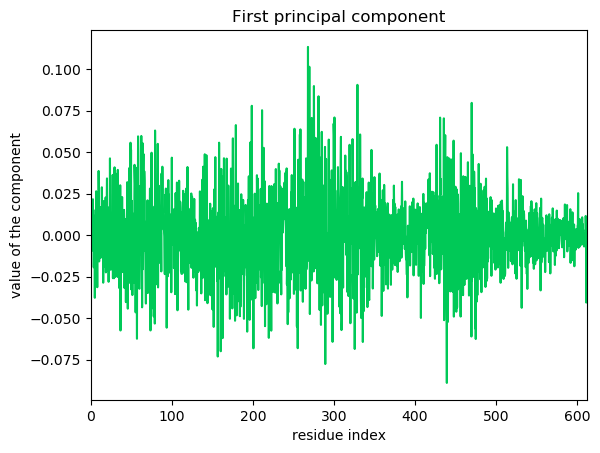

In [27]:
string = np.arange(0,612,100)
labls = [str(i) for i in string]
print(labls)
print(len(labls))


plt.figure()
plt.plot(np.arange(pca_ca6.p_components[0].shape[0]), pca_ca6.p_components[0], label='first component', color = colors[4])
#plt.plot(np.arange(pca_ca3.p_components[1].shape[0]), pca_ca3.p_components[1], label='second component')
#plt.plot(np.arange(pca_ca6.p_components[3].shape[0]), pca_ca6.p_components[3], label='third component')
plt.xticks(ticks=np.arange(0, 612*3,300), labels=labls)
plt.xlabel('residue index'); plt.xlim((0,612*3))
plt.ylabel('value of the component')
plt.title('First principal component')

In [17]:
cos_pc1_3 = pca.cosine_content(pca_space_ca6, i = 0) #index 0 = first PC
print(cos_pc1_3)

0.7551185892339117


# 8D4J - 1

Perform caluclation of PCA for selection of CA, chain 1 and chain 2. 

In [29]:
# CA selection
pca_ca3 = pca.PCA(al_8d4j_3_eq, select='name CA') 
pca_ca3.run()

# chain 1
#pca_ch1 = pca.PCA(al_8d4j_3_eq, select = 'bynum 1:4686 and name CA')
#pca_ch1.run()

# chain 2
#pca_ch2 = pca.PCA(al_8d4j_3_eq, select = 'bynum 4687:9372 and name CA')
#pca_ch2.run()

Explained variance is a statistical measure of how much variation in the dataset can be attributed to each of the principal components - eigenvectors. Since it tells how much of the total variance is 'explained' by each component, explained variance allows to rank components in order of importance. The larger the variance explained by the component, the more that component is important.

In [30]:
# cumulated variance
cumulat_var_pca_ca3 = pca_ca3.cumulated_variance 
#cumulat_var_pca_ch1 = pca_ch1.cumulated_variance 
#cumulat_var_pca_ch2 = pca_ch2.cumulated_variance 

(0, 200)

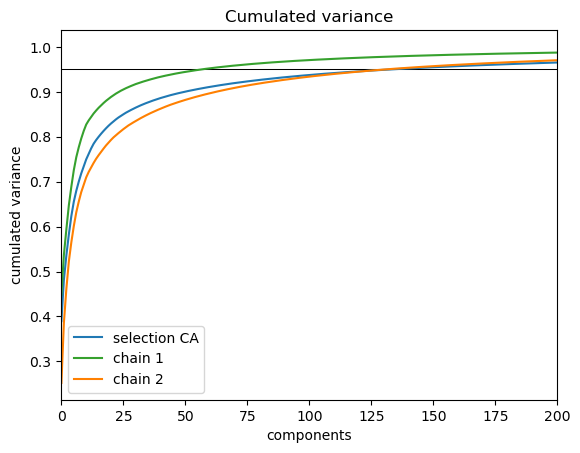

In [9]:
plt.plot(np.arange(cumulat_var_pca_ca3.shape[0]), cumulat_var_pca_ca3, color = col[1], label = 'selection CA')
plt.plot(np.arange(cumulat_var_pca_ch1.shape[0]), cumulat_var_pca_ch1, color = col[3], label = 'chain 1')
plt.plot(np.arange(cumulat_var_pca_ch2.shape[0]), cumulat_var_pca_ch2, color = col[7], label = 'chain 2')
plt.hlines(0.95, xmin = 0, xmax = 200, lw = 0.75, color = 'k')


plt.xlabel('components')
plt.ylabel('cumulated variance')
plt.title('Cumulated variance')
plt.legend(loc = 'best')
plt.xlim([0,200])

In [10]:
n_pcs_ca = np.where(cumulat_var_pca_ca3 > 0.95)[0][0]
n_pcs_ch1 = np.where(cumulat_var_pca_ch1 > 0.95)[0][0]
n_pcs_ch2 = np.where(cumulat_var_pca_ch2 > 0.95)[0][0]
#atomgroup = u.select_atoms('name CA')
#pca_space = pca_ca.transform(atomgroup, n_components=n_pcs_ca)
print('CA -  index of the first component that has cumulated variance greater than 95% :',n_pcs_ca)
print('ch1 - index of the first component that has cumulated variance greater than 95%:',n_pcs_ch1)
print('ch2 - index of the first component that has cumulated variance greater than 95% :',n_pcs_ch2)

CA -  index of the first component that has cumulated variance greater than 95% : 133
ch1 - index of the first component that has cumulated variance greater than 95%: 57
ch2 - index of the first component that has cumulated variance greater than 95% : 131


In [32]:
#prt_sel = al_8d4j_3_eq.select_atoms('protein')
ca_sel3 = al_8d4j_3_eq.select_atoms('name CA')
#ch1_sel = al_8d4j_3_eq.select_atoms('bynum 1:4686 and name CA')
#ch2_sel = al_8d4j_3_eq.select_atoms('bynum 4687:9372 and name CA')
#n_prt = len(prt_sel)
n_ca = len(ca_sel3)
#n_ch1 = len(ch1_sel)
#n_ch2 = len(ch2_sel)
print('There are {} ca atoms in the analysis'.format(n_ca), 'components : ', pca_ca3.p_components.shape)
#print('There are {} ch1 atoms in the analysis'.format(n_ch1), 'components : ', pca_ch1.p_components.shape)
#print('There are {} ch2 atoms in the analysis'.format(n_ch2), 'components : ', pca_ch2.p_components.shape)

There are 612 ca atoms in the analysis components :  (1836, 1836)


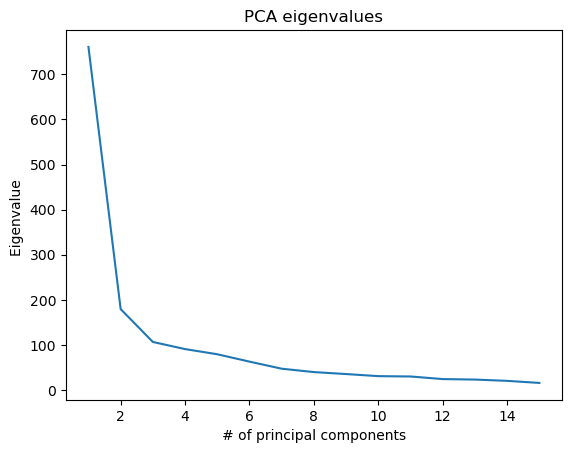

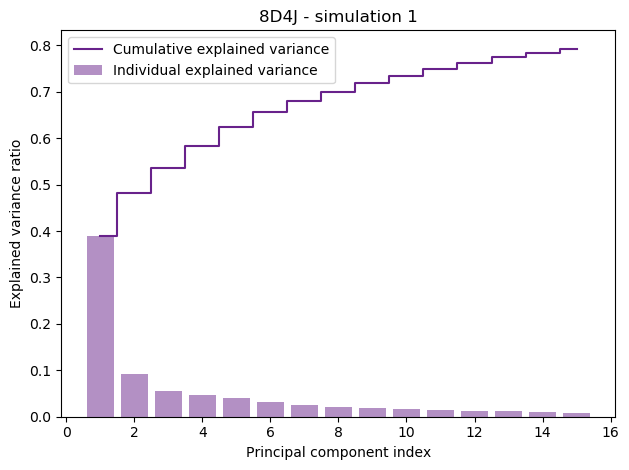

In [12]:
max_pc = 15
plt.figure()
plt.plot(np.arange(0,max_pc)+1, pca_ca3.variance[0:max_pc])
plt.xlabel('# of principal components')
plt.ylabel('Eigenvalue ')
plt.title('PCA eigenvalues')


# total variance from all the PC
egnv_ca = pca_ca3.variance
tot_egnv_ca = sum(egnv_ca)

# explained variance for all PC : it is calculated as the ratio between the variance of each principal
# component over the total variance
var_exp = [(i/tot_egnv_ca) for i in sorted(egnv_ca, reverse=True)]

plt.figure()
plt.bar(np.arange(0,max_pc)+1, var_exp[:max_pc], alpha=0.5, color = colors[0],align='center', label='Individual explained variance')
plt.step(np.arange(0,max_pc)+1, cumulat_var_pca_ca3[:max_pc], where='mid',label='Cumulative explained variance', color = colors[0])
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('8D4J - simulation 1')
plt.legend(loc='best')
plt.tight_layout()
plt.show()



In [33]:
#projection of the number of selected components onto the trajectory
# transforms a given atom group into weights over each PC 
pca_space_ca3 = pca_ca3.transform(al_8d4j_3_eq.select_atoms('name CA'), n_components = 3) 
#pca_space_ch1 = pca_ch1.transform(al_8d4j_3_eq.select_atoms('bynum 1:4686 and name CA'), n_components = 3)
#pca_space_ch2 = pca_ch2.transform(al_8d4j_3_eq.select_atoms('bynum 4687:9372 and name CA'), n_components = 3)

for i in range(3):
    print(i, f"CA - Cumulated variance: {cumulat_var_pca_ca3[i]:.3f}")
print()
#for i in range(3):
#    print(f"ch1 - Cumulated variance: {cumulat_var_pca_ch1[i]:.3f}")
#print()
#for i in range(3):
#    print(f"ch2 - Cumulated variance: {cumulat_var_pca_ch2[i]:.3f}")



0 CA - Cumulated variance: 0.389
1 CA - Cumulated variance: 0.481
2 CA - Cumulated variance: 0.536



In [34]:
pca_data_ca3 = pd.DataFrame(pca_space_ca3,columns=['first_comp','second_comp','third_comp'])
df_ca3 = pca_data_ca3
n_components = 3

components = pca_space_ca3

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
#labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    color=df_ca3.index.values,
    labels=labels
)
fig.update_traces(diagonal_visible=False)
fig.update_coloraxes(colorbar_title='Frame')

fig.show()

In [15]:
pc1 = pca_ca3.p_components[:, 0]
trans1 = pca_space_ca3[:, 0]
projected = np.outer(trans1, pc1) + pca_ca3.mean.flatten()
coordinates = projected.reshape(len(trans1), -1, 3)

proj1 = mda.Merge(ca_sel3)
proj1.load_new(coordinates, order="fac")


<Universe with 612 atoms>

In [16]:
print(proj1)

<Universe with 612 atoms>


In [17]:
import nglview as nv
view = nv.show_mdanalysis(proj1.atoms)

view

NGLWidget(max_frame=8000)

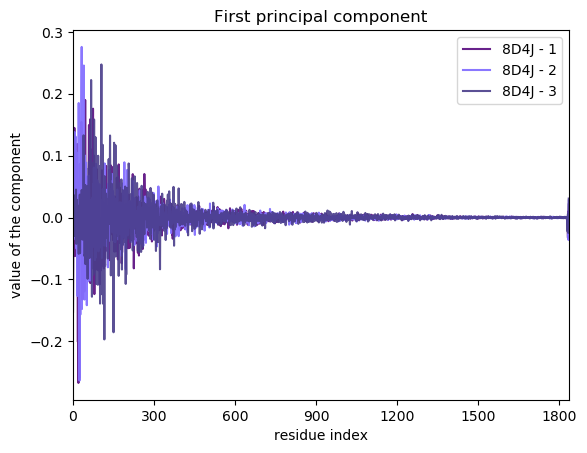

In [70]:

plt.figure()
#plt.plot(np.arange(pca_ca6.p_components[0].shape[0]), pca_ca6.p_components[0], label='6XHU', color = colors[4])
#plt.plot(np.arange(pca_ca7vh8.p_components[0].shape[0]), pca_ca7vh8.p_components[0], label='7VH8', color = colors[3], alpha = 0.9)


plt.plot(np.arange(pca_ca3.p_components[0].shape[0]), pca_ca3.p_components[0], label='8D4J - 1', color = colors[0], alpha = 1)
plt.plot(np.arange(pca_ca4.p_components[0].shape[0]), pca_ca4.p_components[0], label='8D4J - 2', color = colors[1], alpha = 0.95)
plt.plot(np.arange(pca_ca5.p_components[0].shape[0]), pca_ca5.p_components[0], label='8D4J - 3', color = colors[2], alpha = 0.9)

plt.xticks(ticks=np.arange(0, 612*3,300))
plt.xlabel('residue index'); plt.xlim((0,612*3))
plt.ylabel('value of the component')
plt.title('First principal component')
plt.legend()

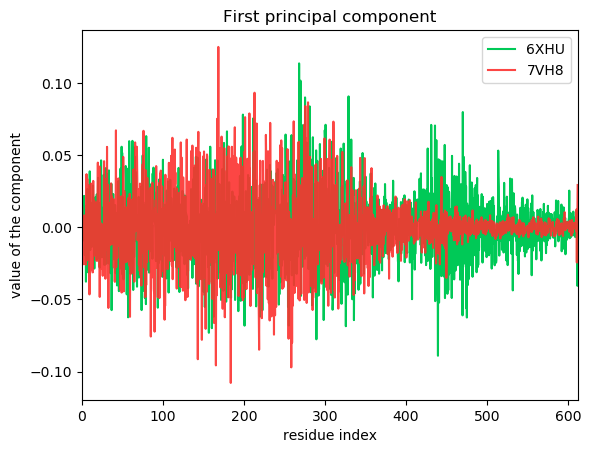

In [54]:
plt.plot(np.arange(pca_ca6.p_components[0].shape[0]), pca_ca6.p_components[0], label='6XHU', color = colors[4])
plt.plot(np.arange(pca_ca7vh8.p_components[0].shape[0]), pca_ca7vh8.p_components[0], label='7VH8', color = colors[3], alpha= 0.9)

plt.xticks(ticks=np.arange(0, 612*3,300), labels=labls)
plt.xlabel('residue index'); plt.xlim((0,612*3))
plt.ylabel('value of the component')
plt.title('First principal component')
plt.legend()

In [68]:
print(np.arange(pca_ca3.p_components[0].shape[0]))

[   0    1    2    3    4    5    6    7    8    9   10   11   12   13
   14   15   16   17   18   19   20   21   22   23   24   25   26   27
   28   29   30   31   32   33   34   35   36   37   38   39   40   41
   42   43   44   45   46   47   48   49   50   51   52   53   54   55
   56   57   58   59   60   61   62   63   64   65   66   67   68   69
   70   71   72   73   74   75   76   77   78   79   80   81   82   83
   84   85   86   87   88   89   90   91   92   93   94   95   96   97
   98   99  100  101  102  103  104  105  106  107  108  109  110  111
  112  113  114  115  116  117  118  119  120  121  122  123  124  125
  126  127  128  129  130  131  132  133  134  135  136  137  138  139
  140  141  142  143  144  145  146  147  148  149  150  151  152  153
  154  155  156  157  158  159  160  161  162  163  164  165  166  167
  168  169  170  171  172  173  174  175  176  177  178  179  180  181
  182  183  184  185  186  187  188  189  190  191  192  193  194  195
  196 

In [27]:
cos_pc1_3 = pca.cosine_content(pca_space_ca3, i = 0) #index 0 = first PC
print(cos_pc1_3)


0.6730355560123673


# 8D4J - 2 

In [41]:
# CA selection
pca_ca4 = pca.PCA(al_8d4j_4_eq, select='name CA') 
pca_ca4.run()

In [42]:
cumulat_var_pca_ca4 = pca_ca4.cumulated_variance 
ca_sel4 = al_8d4j_4_eq.select_atoms('name CA')

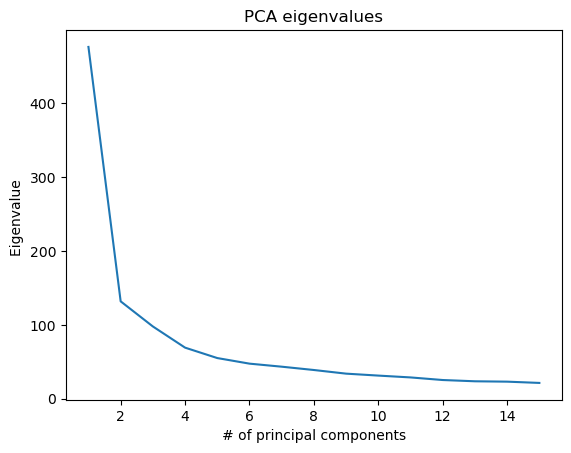

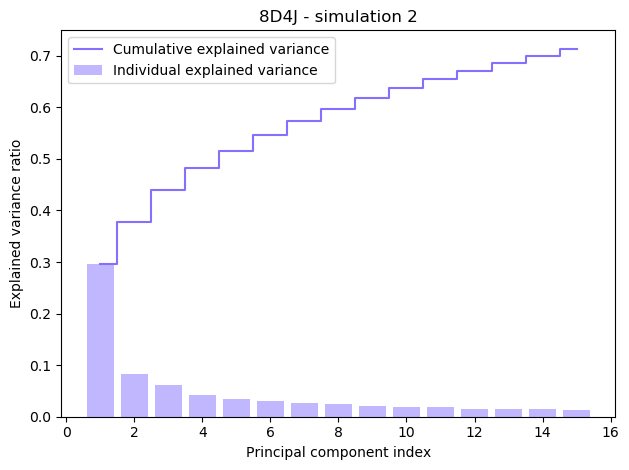

In [55]:
max_pc = 15
plt.figure()
plt.plot(np.arange(0,max_pc)+1, pca_ca4.variance[0:max_pc])
plt.xlabel('# of principal components')
plt.ylabel('Eigenvalue ')
plt.title('PCA eigenvalues')


# total variance from all the PC
egnv_ca4 = pca_ca4.variance
tot_egnv_ca4 = sum(egnv_ca4)

# explained variance for all PC : it is calculated as the ratio between the variance of each principal
# component over the total variance
var_exp4 = [(i/tot_egnv_ca4) for i in sorted(egnv_ca4, reverse=True)]

plt.figure()
plt.bar(np.arange(0,max_pc)+1, var_exp4[:max_pc], alpha=0.5, color = colors[1],align='center', label='Individual explained variance')
plt.step(np.arange(0,max_pc)+1, cumulat_var_pca_ca4[:max_pc], where='mid',label='Cumulative explained variance', color = colors[1])
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('8D4J - simulation 2')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [43]:
#projection of the number of selected components onto the trajectory
# transforms a given atom group into weights over each PC 
pca_space_ca4 = pca_ca4.transform(al_8d4j_4_eq.select_atoms('name CA'), n_components = 3) 
for i in range(3):
    print(i, f"CA - Cumulated variance: {cumulat_var_pca_ca4[i]:.3f}")

0 CA - Cumulated variance: 0.296
1 CA - Cumulated variance: 0.378
2 CA - Cumulated variance: 0.439


In [32]:
cos_pc1_4 = pca.cosine_content(pca_space_ca4, i = 0) #index 0 = first PC
print(cos_pc1_4)



0.7322314873921241


In [57]:
pca_data_ca4 = pd.DataFrame(pca_space_ca4,columns=['first_comp','second_comp','third_comp'])
df_ca4 = pca_data_ca4
n_components = 3

components = pca_space_ca4

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
#labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    color=df_ca4.index.values,
    labels=labels
)
fig.update_traces(diagonal_visible=False)
fig.update_coloraxes(colorbar_title='Frame')

fig.show()

# 8D4J -3 

In [44]:
# CA selection
pca_ca5 = pca.PCA(al_8d4j_5_eq, select='name CA') 
pca_ca5.run()

In [24]:
cumulat_var_pca_ca5 = pca_ca5.cumulated_variance 
ca_sel5 = al_8d4j_5_eq.select_atoms('name CA')

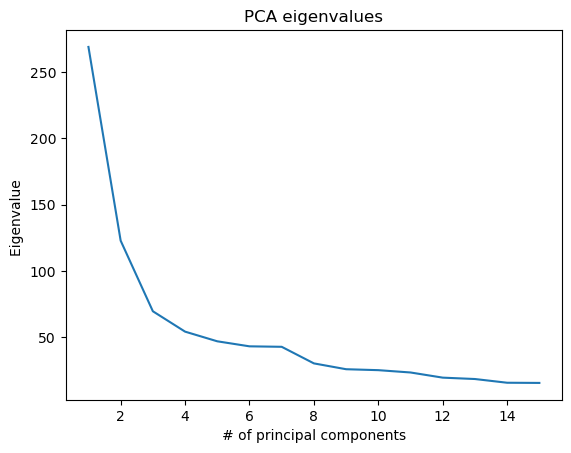

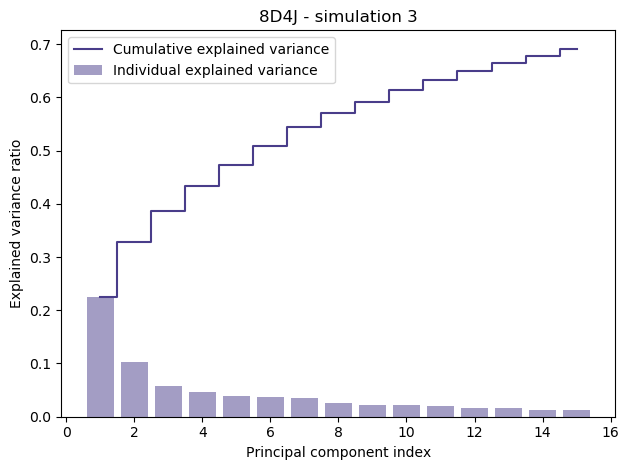

In [25]:
max_pc = 15
plt.figure()
plt.plot(np.arange(0,max_pc)+1, pca_ca5.variance[0:max_pc])
plt.xlabel('# of principal components')
plt.ylabel('Eigenvalue ')
plt.title('PCA eigenvalues')


# total variance from all the PC
egnv_ca5 = pca_ca5.variance
tot_egnv_ca5 = sum(egnv_ca5)

# explained variance for all PC : it is calculated as the ratio between the variance of each principal
# component over the total variance
var_exp5 = [(i/tot_egnv_ca5) for i in sorted(egnv_ca5, reverse=True)]

plt.figure()
plt.bar(np.arange(0,max_pc)+1, var_exp5[:max_pc], alpha=0.5, color = colors[2],align='center', label='Individual explained variance')
plt.step(np.arange(0,max_pc)+1, cumulat_var_pca_ca5[:max_pc], where='mid',label='Cumulative explained variance', color = colors[2])
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('8D4J - simulation 3')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [34]:
#projection of the number of selected components onto the trajectory
# transforms a given atom group into weights over each PC 
pca_space_ca5 = pca_ca5.transform(al_8d4j_5_eq.select_atoms('name CA'), n_components = 3) 
for i in range(3):
    print(i, f"CA - Cumulated variance: {cumulat_var_pca_ca5[i]:.3f}")

NameError: name 'cumulat_var_pca_ca5' is not defined

In [35]:
cos_pc1_5 = pca.cosine_content(pca_space_ca5, i = 0) #index 0 = first PC
print(cos_pc1_5)



0.47416980216848353


In [47]:
pca_data_ca5 = pd.DataFrame(pca_space_ca5,columns=['first_comp','second_comp','third_comp'])
df_ca5 = pca_data_ca5
n_components = 3

components = pca_space_ca5

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
#labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    color=df_ca5.index.values,
    labels=labels
)
fig.update_traces(diagonal_visible=False)
fig.update_coloraxes(colorbar_title='Frame')

fig.show()

# 7VH8

In [45]:
# CA selection
pca_ca7vh8 = pca.PCA(al_7vh8_eq, select='name CA') 
pca_ca7vh8.run()

In [28]:
cumulat_var_pca_ca7vh8 = pca_ca7vh8.cumulated_variance 
ca_sel7vh8 = al_7vh8_eq.select_atoms('name CA')

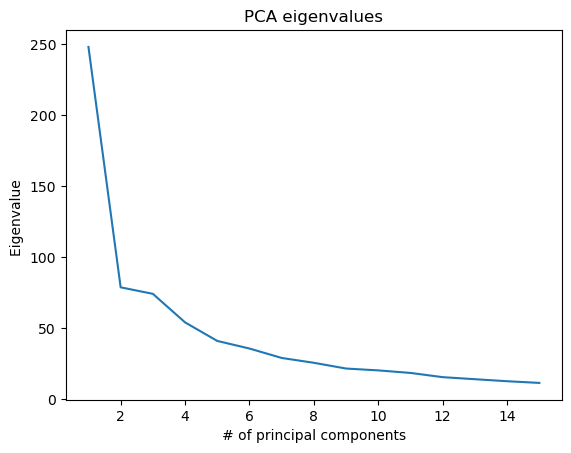

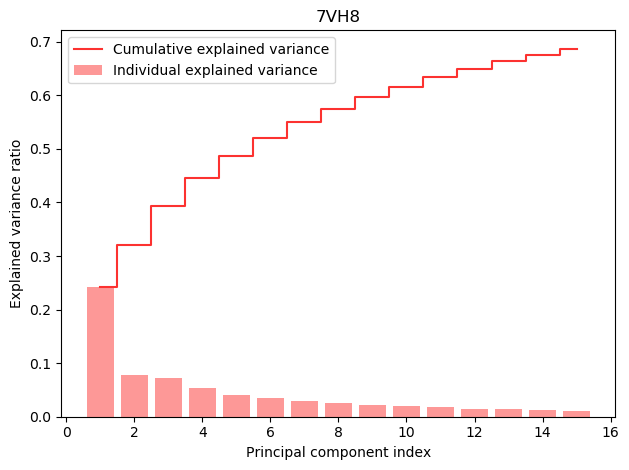

In [29]:
max_pc = 15
plt.figure()
plt.plot(np.arange(0,max_pc)+1, pca_ca7vh8.variance[0:max_pc])
plt.xlabel('# of principal components')
plt.ylabel('Eigenvalue ')
plt.title('PCA eigenvalues')


# total variance from all the PC
egnv_ca7vh8 = pca_ca7vh8.variance
tot_egnv_ca7vh8 = sum(egnv_ca7vh8)

# explained variance for all PC : it is calculated as the ratio between the variance of each principal
# component over the total variance
var_exp7vh8 = [(i/tot_egnv_ca7vh8) for i in sorted(egnv_ca7vh8, reverse=True)]

plt.figure()
plt.bar(np.arange(0,max_pc)+1, var_exp7vh8[:max_pc], alpha=0.5, color = colors[3],align='center', label='Individual explained variance')
plt.step(np.arange(0,max_pc)+1, cumulat_var_pca_ca7vh8[:max_pc], where='mid',label='Cumulative explained variance', color = colors[3])
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.title('7VH8')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [37]:
#projection of the number of selected components onto the trajectory
# transforms a given atom group into weights over each PC 
pca_space_ca7vh8 = pca_ca7vh8.transform(al_7vh8_eq.select_atoms('name CA'), n_components = 3) 
for i in range(3):
    print(i, f"CA - Cumulated variance: {cumulat_var_pca_ca7vh8[i]:.3f}")

NameError: name 'cumulat_var_pca_ca7vh8' is not defined

In [38]:
cos_pc1_7 = pca.cosine_content(pca_space_ca7vh8, i = 0) #index 0 = first PC
print(cos_pc1_7)



0.6742872854397347


In [52]:
#### pca_data_ca7 = pd.DataFrame(pca_space_ca7vh8,columns=['first_comp','second_comp','third_comp'])
df_ca7 = pca_data_ca7
n_components = 3

components = pca_space_ca7vh8

labels = {str(i): f"PC {i+1}" for i in range(n_components)}
#labels['color'] = 'Median Price'

fig = px.scatter_matrix(
    components,
    dimensions=range(n_components),
    color=df_ca7.index.values,
    labels=labels
)
fig.update_traces(diagonal_visible=False)
fig.update_coloraxes(colorbar_title='Frame')

fig.show()

# Begin trial

In [64]:
df = pd.DataFrame(pca_space_ca,
                  columns=['PC{}'.format(i+1) for i in range(3)])
df['Time (ps)'] = df.index * al_8d4j_3_eq.trajectory.dt
df.head()

,PC1,PC2,PC3,Time (ps)
0,-55.098784,15.320660,-6.074103,0.0
1,-61.866975,16.048227,-5.515684,50.0
2,-57.661576,11.774384,-10.519356,100.0
3,-56.618881,11.129580,-8.482203,150.0
4,-56.696402,9.572410,-9.756747,200.0


In [69]:
pc1 = pca_ca3.p_components[:, 0]
trans1 = pca_space_ca3[:, 0]
projected = np.outer(trans1, pc1) + pca_ca.mean.flatten()
coordinates = projected.reshape(len(trans1), -1, 3)

proj1 = mda.Merge(ca_sel)
proj1.load_new(coordinates, order="fac")

import nglview as nv

view = nv.show_mdanalysis(proj1.atoms)
view

NGLWidget(max_frame=8000)

# End trial

In [60]:
#last_frames=800
#df = pca_data_ca.tail(last_frames)
pca_data_ca = pd.DataFrame(pca_space_ca,columns=['first_comp','second_comp','third_comp'])
df_ca = pca_data_ca

fig = px.scatter_3d(df_ca, x='first_comp', y='second_comp', z='third_comp',
              color=df_ca.index.values, width=900,height=800)
#fig.show()